In [9]:
!pip install -Uqq fastbook
!pip install jmd_imagescraper

In [10]:
import fastbook
from fastbook import *
from fastai.vision.widgets import *
from pathlib import PureWindowsPath
from jmd_imagescraper.core import *
from pathlib import Path

In [11]:
fastbook.setup_book()

Mounted at /content/gdrive


In [13]:
root = Path().cwd()/"Fruits"

duckduckgo_search(root, "Apple", "Apple fruit", max_results=150)
duckduckgo_search(root, "Orange", "Orange Fruit", max_results=150)
duckduckgo_search(root, "Kiwi", "Kiwi fruit", max_results=150)
duckduckgo_search(root, "Mango", "Mango Fruit", max_results=150)
duckduckgo_search(root, "Pineapple", "Pineapple Fruit", max_results=150)
duckduckgo_search(root, "Watermelon", "watermolon Fruit", max_results=150)
duckduckgo_search(root, "Banana", "Banana Fruit", max_results=150)
duckduckgo_search(root, "Pomegranate ", "Pomegranate  Fruit", max_results=150)


Duckduckgo search: Apple fruit


Duckduckgo search: Orange Fruit


Duckduckgo search: Kiwi fruit


Duckduckgo search: Mango Fruit


Duckduckgo search: Pineapple Fruit


Duckduckgo search: watermolon Fruit


Duckduckgo search: Banana Fruit


Duckduckgo search: Pomegranate  Fruit


[Path('/content/Fruits/Pomegranate /001_c0bf8675.jpg'),
 Path('/content/Fruits/Pomegranate /002_d377996e.jpg'),
 Path('/content/Fruits/Pomegranate /003_467e0da5.jpg'),
 Path('/content/Fruits/Pomegranate /004_2c7fd3ea.jpg'),
 Path('/content/Fruits/Pomegranate /005_2daa5120.jpg'),
 Path('/content/Fruits/Pomegranate /006_4baed73c.jpg'),
 Path('/content/Fruits/Pomegranate /007_4edb6df1.jpg'),
 Path('/content/Fruits/Pomegranate /008_555fb7ac.jpg'),
 Path('/content/Fruits/Pomegranate /009_cf08db88.jpg'),
 Path('/content/Fruits/Pomegranate /010_b7e5a2b0.jpg'),
 Path('/content/Fruits/Pomegranate /011_7dd727e4.jpg'),
 Path('/content/Fruits/Pomegranate /012_19e09146.jpg'),
 Path('/content/Fruits/Pomegranate /013_f7368362.jpg'),
 Path('/content/Fruits/Pomegranate /014_37f7642f.jpg'),
 Path('/content/Fruits/Pomegranate /015_0cee820d.jpg'),
 Path('/content/Fruits/Pomegranate /016_3e22cb53.jpg'),
 Path('/content/Fruits/Pomegranate /017_bee2d2f1.jpg'),
 Path('/content/Fruits/Pomegranate /018_486092ec

In [32]:
path = Path('Fruits')
fns = get_image_files(path)
fns

(#1240) [Path('Fruits/Kiwi/064_98351681.jpg'),Path('Fruits/Kiwi/020_a49d2620.jpg'),Path('Fruits/Kiwi/030_3b103aae.jpg'),Path('Fruits/Kiwi/113_8ff70598.jpg'),Path('Fruits/Kiwi/074_4c0687ee.jpg'),Path('Fruits/Kiwi/085_70d80fd2.jpg'),Path('Fruits/Kiwi/066_50ff9348.jpg'),Path('Fruits/Kiwi/145_4a25af6a.jpg'),Path('Fruits/Kiwi/004_fec92f76.jpg'),Path('Fruits/Kiwi/125_36b56db9.jpg')...]

In [33]:
failed = verify_images(fns)
failed

(#0) []

In [34]:
failed.map(Path.unlink);

In [35]:
class DataLoaders(GetAttr):
    def __init__(self, *loaders): self.loaders = loaders
    def __getitem__(self, i): return self.loaders[i]
    train,valid = add_props(lambda i,self: self[i])

In [36]:
fruits = DataBlock(
    blocks=(ImageBlock, CategoryBlock), 
    get_items=get_image_files, 
    splitter=RandomSplitter(valid_pct=0.3, seed=42),
    get_y=parent_label,
    item_tfms=Resize(128))

In [37]:
dls = fruits.dataloaders(path)

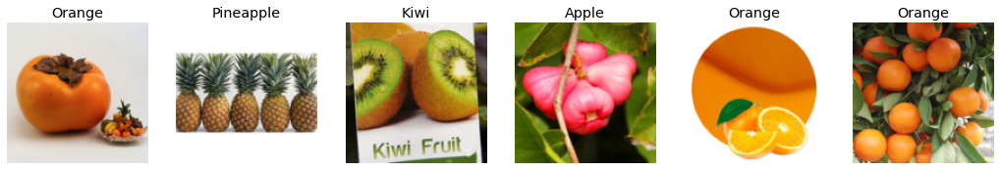

In [38]:
dls.valid.show_batch(max_n=6, nrows=1)

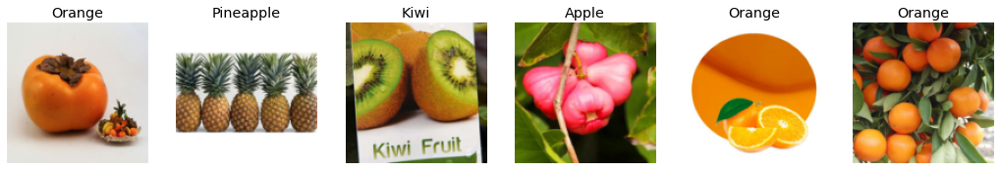

In [39]:
fruits = fruits.new(item_tfms=Resize(128, ResizeMethod.Squish))
dls = fruits.dataloaders(path)
dls.valid.show_batch(max_n=6, nrows=1)

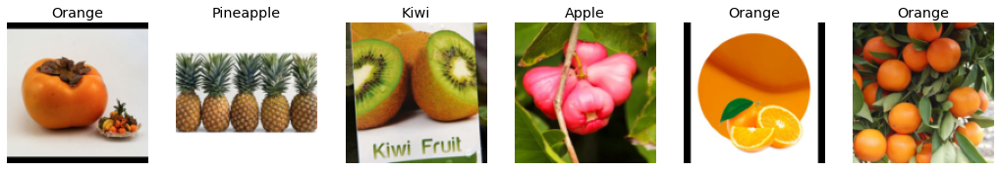

In [40]:
fruits = fruits.new(item_tfms=Resize(128, ResizeMethod.Pad, pad_mode='zeros'))
dls = fruits.dataloaders(path)
dls.valid.show_batch(max_n=6, nrows=1)

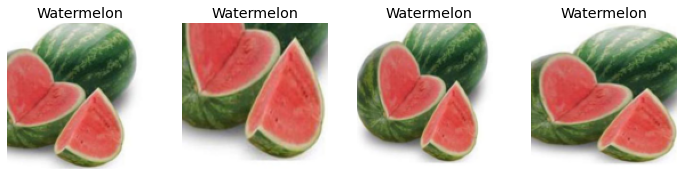

In [41]:
fruits = fruits.new(item_tfms=RandomResizedCrop(128, min_scale=0.3))
dls = fruits.dataloaders(path)
dls.train.show_batch(max_n=4, nrows=1, unique=True)

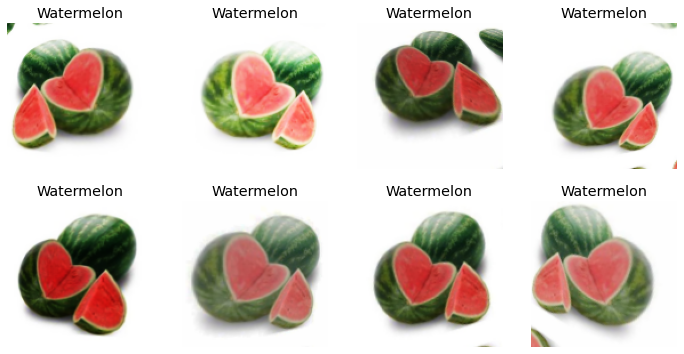

In [42]:
fruits = fruits.new(item_tfms=Resize(128), batch_tfms=aug_transforms(mult=2))
dls = fruits.dataloaders(path)
dls.train.show_batch(max_n=8, nrows=2, unique=True)

In [43]:
fruits = fruits.new(
    item_tfms=RandomResizedCrop(224, min_scale=0.5),
    batch_tfms=aug_transforms())
dls = fruits.dataloaders(path)

In [44]:
fruits = fruits.new(
    item_tfms=RandomResizedCrop(224, min_scale=0.5),
    batch_tfms=aug_transforms())
dls = fruits.dataloaders(path)

In [45]:
learn = cnn_learner(dls, resnet18, metrics=error_rate)
learn.fine_tune(4)

epoch,train_loss,valid_loss,error_rate,time
0,2.378894,0.924619,0.239247,03:02


epoch,train_loss,valid_loss,error_rate,time
0,0.859469,0.628923,0.166667,04:00
1,0.698466,0.481937,0.129032,03:58
2,0.545301,0.444364,0.112903,04:01
3,0.436177,0.447068,0.120968,03:58


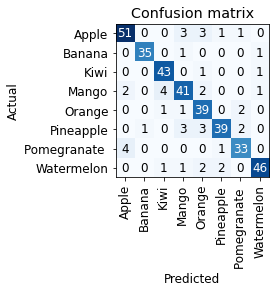

In [46]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

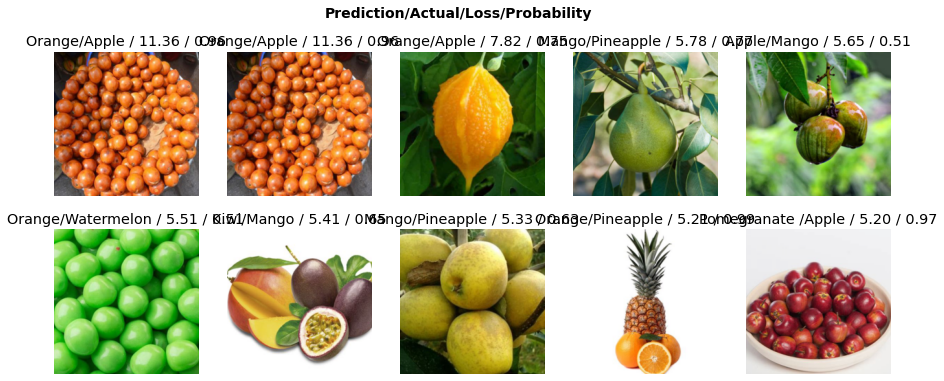

In [47]:
interp.plot_top_losses(10, nrows=2)

In [30]:
cleaner = ImageClassifierCleaner(learn)
cleaner

In [31]:
for idx in cleaner.delete(): cleaner.fns[idx].unlink()
for idx,cat in cleaner.change(): shutil.move(str(cleaner.fns[idx]), path/cat)

In [48]:
learn.export()

In [49]:
path = Path()
path.ls(file_exts='.pkl')

(#1) [Path('export.pkl')]

In [50]:
learn_inf = load_learner(path/'fruits.pkl')

In [93]:
btn_upload = widgets.FileUpload()
btn_upload

FileUpload(value={}, description='Upload')

In [90]:
img = PILImage.create(btn_upload.data[-1])

In [91]:
pred,pred_idx,probs = learn_inf.predict(img)

In [92]:
lbl_pred = widgets.Label()
lbl_pred.value = f'Prediction: {pred}; Probability: {probs[pred_idx]:.04f}'
lbl_pred

Label(value='Prediction: Apple; Probability: 0.9998')

In [86]:
out_pl = widgets.Output()
out_pl.clear_output()
with out_pl: display(img.to_thumb(128,128))
out_pl

Output()

In [78]:
def on_click_classify(change):
    img = PILImage.create(btn_upload.data[-1])
    out_pl.clear_output()
    with out_pl: display(img.to_thumb(128,128))
    pred,pred_idx,probs = learn_inf.predict(img)
    lbl_pred.value = f'Prediction: {pred}; Probability: {probs[pred_idx]:.04f}'

btn_run.on_click(on_click_classify)

In [79]:
btn_upload = widgets.FileUpload()

In [87]:
btn_run = widgets.Button(description='Classify')
btn_run

Button(description='Classify', style=ButtonStyle())

In [88]:
VBox([widgets.Label('Select your bear!'), 
      btn_upload, btn_run, out_pl, lbl_pred])